# Visualización de máquinas inteligentes

Autora: Beatriz Ibarra Mendoza  
Última actualización: 08/01/2024

Este notebook analiza datos relacionados con las reservaciones de un hotel para predecir la cantidad de cancelaciones en una época determinada. Se utiliza downsampling para corregir el desbalance de los datos (el cual es inherente debido al contexto del negocio). Y se entrenan diversos modelos con Scikit learn para realizar las predicciones. Se incluyen las siguientes etapas:  

* *Instalación* de Scikit learn y otras paqueterías.  
* *Datos* (cargar el conjunto de datos).  
* *Análisis exploratorio de datos* (EDA).  
* *Desbalance* de datos.  
* *Downsampling* para corregir el desbalance de datos.  
* *Conjuntos de datos de entrenamiento*.  
* *Modelos de aprendizaje supervisado* (para clasificación).  
  * *Regresión logística*.  
  * *Clasificador de bosques aleatorios*.
* *Selección del mejor modelo* (probabilidad y curva ROC).  
* *Reporte en CSV*.
* *Conclusiones finales.




### Instalación

In [ ]:
!pip install numpy==1.20.3 pandas==1.2.4 yellowbrick==1.3.post1 scikit-learn==0.24.2 ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 18.1 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 32.7 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  Preparing metadata (pyproject.toml) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 271.4/271.4 kB 30.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.5/7.5 MB 66.2 MB/s eta 0:00:00
  Installing build dependencies ... done
  Getting requirements to build wheel ... done
  error: subprocess-exited-with-error
  
  × Preparing metadata (pyproject.toml) did not run successfully.
  │ exit code: 1
  ╰─> See above for output.
  
  note: This error originates from a subprocess, and is likely not a problem with pip.
  Preparing metadata (pyproject.toml) ... error
error: metadata-generation-faile

In [ ]:
!pip install ydata-profiling

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 357.6/357.6 kB 3.1 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 381.9/381.9 kB 19.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 102.7/102.7 kB 13.5 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 679.5/679.5 kB 38.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 296.5/296.5 kB 34.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 4.7/4.7 MB 35.3 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 2.1/2.1 MB 40.8 MB/s eta 0:00:00
  Created wheel for htmlmin: filename=htmlmin-0.1.12-py3-none-any.whl size=27081 sha256=eb0c3ca67d91de91793c0d7d6a9ca700feffdd364a39d7ba3f28937fe43f73e4
  Stored in directory: /root/.cache/pip/wheels/dd/91/29/a79cecb328d01739e64017b6fb9a1ab9d8cb1853098ec5966d
Successfully built htmlmin
  Attempting uninstall: typing-extensions
    Found existing installation: typing_extensions 4.5.0
 

In [ ]:
# Liberías estandar
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Funciones de Scikit-Learn
from sklearn.ensemble import RandomForestClassifier
from sklearn.model_selection import (
    RandomizedSearchCV,
    train_test_split
)

from sklearn.metrics import (
    precision_score,
    recall_score,
    f1_score,
    roc_auc_score,
    confusion_matrix
)

# Funciones de Yellow Brick
from yellowbrick.target import ClassBalance
from yellowbrick.model_selection import (ValidationCurve, FeatureImportances)
from yellowbrick.classifier.threshold import DiscriminationThreshold
from yellowbrick.classifier import (
    ConfusionMatrix,
    ClassPredictionError,
    ClassificationReport,
    PrecisionRecallCurve,
    ROCAUC,
    ClassPredictionError
)

# Importar xgboost
import xgboost as xgb

# Configurar visualizaciones
sns.set_theme(style="whitegrid")
pd.options.display.max_rows = 999
pd.options.display.max_columns = 999

%matplotlib inline

### Datos


In [ ]:
# https://github.com/rfordatascience/tidytuesday/tree/master/data/2020/2020-02-11
tbl_data = (
    # Read data from the internet
    pd.read_csv("https://raw.githubusercontent.com/rfordatascience/tidytuesday/master/data/2020/2020-02-11/hotels.csv")
)

In [ ]:
tbl_data

,hotel,is_canceled,lead_time,arrival_date_year,arrival_date_month,arrival_date_week_number,arrival_date_day_of_month,stays_in_weekend_nights,stays_in_week_nights,adults,children,babies,meal,country,market_segment,distribution_channel,is_repeated_guest,previous_cancellations,previous_bookings_not_canceled,reserved_room_type,assigned_room_type,booking_changes,deposit_type,agent,company,days_in_waiting_list,customer_type,adr,required_car_parking_spaces,total_of_special_requests,reservation_status,reservation_status_date
0,Resort Hotel,0,342,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,3,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
1,Resort Hotel,0,737,2015,July,27,1,0,0,2,0.0,0,BB,PRT,Direct,Direct,0,0,0,C,C,4,No Deposit,NaN,NaN,0,Transient,0.00,0,0,Check-Out,2015-07-01
2,Resort Hotel,0,7,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Direct,Direct,0,0,0,A,C,0,No Deposit,NaN,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
3,Resort Hotel,0,13,2015,July,27,1,0,1,1,0.0,0,BB,GBR,Corporate,Corporate,0,0,0,A,A,0,No Deposit,304.0,NaN,0,Transient,75.00,0,0,Check-Out,2015-07-02
4,Resort Hotel,0,14,2015,July,27,1,0,2,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,240.0,NaN,0,Transient,98.00,0,1,Check-Out,2015-07-03
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
119385,City Hotel,0,23,2017,August,35,30,2,5,2,0.0,0,BB,BEL,Offline TA/TO,TA/TO,0,0,0,A,A,0,No Deposit,394.0,NaN,0,Transient,96.14,0,0,Check-Out,2017-09-06
119386,City Hotel,0,102,2017,August,35,31,2,5,3,0.0,0,BB,FRA,Online TA,TA/TO,0,0,0,E,E,0,No Deposit,9.0,NaN,0,Transient,225.43,0,2,Check-Out,2017-09-07
119387,City Hotel,0,34,2017,August,35,31,2,5,2,0.0,0,BB,DEU,Online TA,TA/TO,0,0,0,D,D,0,No Deposit,9.0,NaN,0,Transient,157.71,0,4,Check-Out,2017-09-07
119388,City Hotel,0,109,2017,August,35,31,2,5,2,0.0,0,BB,GBR,Online TA,TA/TO,0,0,0,A,A,0,No Deposit,89.0,NaN,0,Transient,104.40,0,0,Check-Out,2017-09-07


### Análisis Exploratorio de Datos

In [ ]:
from ydata_profiling import ProfileReport
profile=ProfileReport(tbl_data, title="Pandas Profiling Report")
profile

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### Desbalance de datos

In [ ]:
(tbl_data
     .groupby(['is_canceled'])
     .size()
     .reset_index(name = 'n_reservaciones')
     .assign(pct = lambda df_: df_.n_reservaciones / df_.n_reservaciones.sum() * 100)
     .round(1)
)

,is_canceled,n_reservaciones,pct
0,0,75166,63.0
1,1,44224,37.0


[]

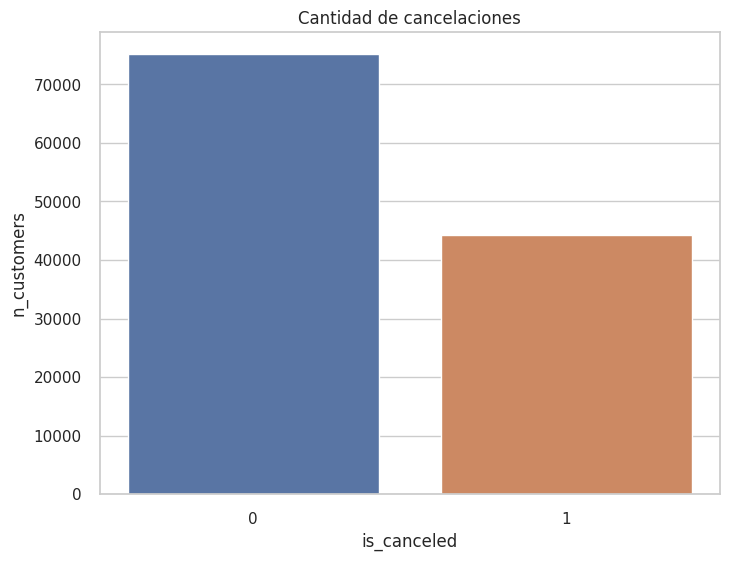

In [ ]:
fig, ax = plt.subplots(figsize = (8, 6))
sns.barplot(
    data = (tbl_data
            .groupby(['is_canceled'])
            .size()
            .reset_index(name = 'n_customers')),
    x = 'is_canceled',
    y = 'n_customers'
)
plt.title("Cantidad de cancelaciones")
plt.plot()

### Downsampling


In [ ]:
def fun_downsample(tbl):
    '''
    Función para hacer downsampling
    tbl: Son los datos originales en forma de dataframe.
    '''
    tbl_reservations_not_cancelled = (
        tbl
            .query('is_canceled == 0')
            .sample(
                n = tbl.groupby(['is_canceled']).size()[1],
                random_state=42)
    )
    # Filtramos la clase minoritaria.
    tbl_reservations_cancelled = tbl.query('is_canceled == 1')

    return pd.concat([
        tbl_reservations_not_cancelled,
        tbl_reservations_cancelled
    ])

tbl_downsampled_data = fun_downsample(tbl_data)

In [ ]:
(tbl_downsampled_data
     .groupby(['is_canceled'])
     .size()
     .reset_index(name = 'n_reservaciones')
     .assign(pct = lambda df_: df_.n_reservaciones / df_.n_reservaciones.sum() * 100)
     .round(1)
)

,is_canceled,n_reservaciones,pct
0,0,44224,50.0
1,1,44224,50.0


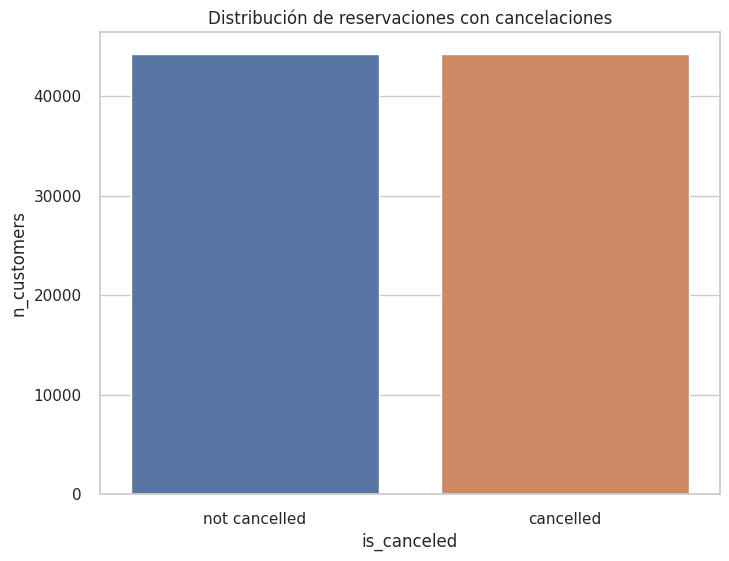

In [ ]:
fig, ax = plt.subplots(figsize = (8, 6))
sns.barplot(
    data = (tbl_downsampled_data
            .groupby(['is_canceled'])
            .size()
            .reset_index(name = 'n_customers')
            .assign(is_canceled = lambda df_: df_.is_canceled.replace({0: 'not cancelled', 1: 'cancelled'}))),
    x = 'is_canceled',
    y = 'n_customers'
)
plt.title("Distribución de reservaciones con cancelaciones")
plt.show()

### Conjuntos de datos de entrenamiento

In [ ]:
from sklearn.model_selection import train_test_split

y = tbl_downsampled_data.is_canceled
X = tbl_downsampled_data.drop(columns = 'is_canceled')

X_train, X_test, y_train, y_test = train_test_split(
    X, y,
    test_size=0.2,
    random_state=42
)

In [ ]:
print(f'X_train shape: {X_train.shape}')
print(f'y_train shape: {y_train.shape}')

X_train shape: (70758, 31)
y_train shape: (70758,)


In [ ]:
print(f'X_test shape: {X_test.shape}')
print(f'y_test shape: {y_test.shape}')

X_test shape: (17690, 31)
y_test shape: (17690,)


### Modelos de aprendizaje supervisado (para clasificación).

In [ ]:
from sklearn.preprocessing import OneHotEncoder

variable_selection_numeric = ['lead_time', 'previous_cancellations', 'previous_bookings_not_canceled']
variable_selection_categoric = ['deposit_type','hotel', 'market_segment']               # variables categóricas

def prep_for_ml(tbl_train, tbl_test):
    '''Clean X_train and X_test
        1) Select continuous and categorical variables.
        2) Convert categorical variables to one hot encoding
        3) Concatenate clean dataframes
    '''
    # Variables continuas
    tbl_num_train = tbl_train.loc[:, variable_selection_numeric]
    tbl_num_test = tbl_test.loc[:, variable_selection_numeric]

    # Variables categóricas
    tbl_cat_train = tbl_train.loc[:, variable_selection_categoric]
    tbl_cat_test = tbl_test.loc[:, variable_selection_categoric]

    ohe = OneHotEncoder(drop = 'first', sparse = False)
    ohe.fit(tbl_cat_train)
    col_names = ohe.get_feature_names_out()

    tbl_ohe_cat_train = pd.DataFrame(
        ohe.transform( tbl_cat_train )
    )

    tbl_ohe_cat_test = pd.DataFrame(
        ohe.transform( tbl_cat_test )
    )
    # Nombres de columnas
    tbl_ohe_cat_train.columns = col_names
    tbl_ohe_cat_test.columns = col_names

    # Variables categóricas + continuas transformadas
    tbl_train_clean = pd.concat([tbl_num_train.reset_index(drop = True), tbl_ohe_cat_train], axis = 1)
    tbl_test_clean = pd.concat([tbl_num_test.reset_index(drop = True), tbl_ohe_cat_test], axis = 1)

    return (tbl_train_clean, tbl_test_clean)

X_train_clean, X_test_clean = prep_for_ml(X_train, X_test)

/usr/local/lib/python3.10/dist-packages/sklearn/preprocessing/_encoders.py:868: FutureWarning: `sparse` was renamed to `sparse_output` in version 1.2 and will be removed in 1.4. `sparse_output` is ignored unless you leave `sparse` to its default value.
  warnings.warn(


In [ ]:
# Validación
assert X_train_clean.columns.tolist() == X_test_clean.columns.tolist()

#### Regresión logística

In [ ]:
# Entrenamiento de modelo
from sklearn.linear_model import LogisticRegression
from sklearn.preprocessing import StandardScaler

scaler = StandardScaler()
scaler.fit(X_train_clean)

X_train_scaler = scaler.transform(X_train_clean)
X_test_scaler = scaler.transform(X_test_clean)

lr = LogisticRegression()
lr.fit(X_train_scaler, y_train)

y_pred = lr.predict(X_test_scaler)

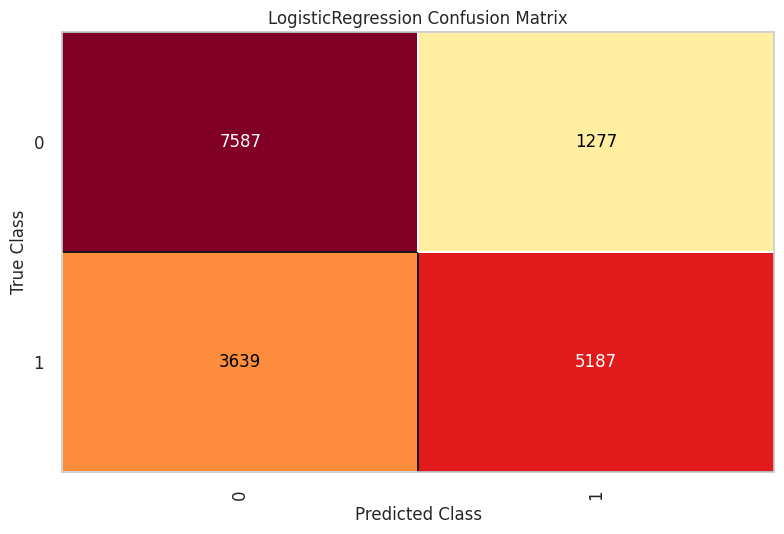

<Axes: title={'center': 'LogisticRegression Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
# Matriz de confusión
cm = ConfusionMatrix(lr, classes=[0, 1])
cm.fit(X_train_scaler, y_train)
cm.score(X_test_scaler, y_test)
cm.show()

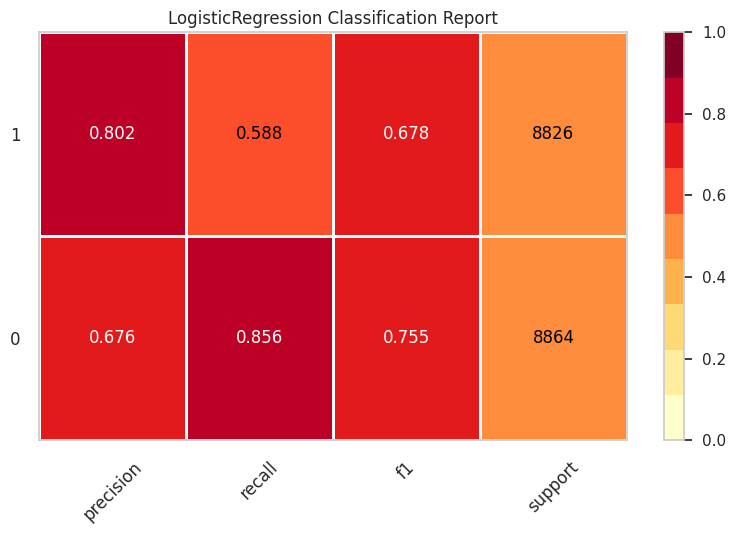

<Axes: title={'center': 'LogisticRegression Classification Report'}>

In [ ]:
# Reporte de clasificación
visualizer = ClassificationReport(lr, classes=[0, 1], support=True)
visualizer.fit(X_train_scaler, y_train)
visualizer.score(X_test_scaler, y_test)
visualizer.show()

Conclusiones preliminares  
* De acuerdo con la matriz de confusión, este modelo predice que la mayoría de los registros (huéspedes) no van a realizar una cancelación, lo cual coincide con la premisa de que las cancelaciones de reservaciones son mínimas en un hotel.  
* Sin embargo, aún existen 1277 registros clasificados como falso-positivos (el modelo predice que habrá cancelación pero en realidad no la hay), y 3639 registros clasificados como falso-negativos, lo cual es un valor alto considerando que el modelo establece que no habrá cancelación cuando si la hay.  
* De acuerdo con el reporte de indicadores de rendimiento del modelo, los valores de f1 para la clasificación de 'cancelación' son de 0.678 y para 'no cancelación' de 0.755. Se buscará mejorar estos índices con el ajuste de hiperparámetros.

##### Búsqueda de hiperparámetros


In [ ]:
from sklearn.model_selection import RandomizedSearchCV
from scipy.stats import loguniform

# Definir los hiperparámetros a ajustar
parameters = {
    'C': loguniform(1e-4, 1e4),
    'solver': ['newton-cg', 'lbfgs', 'liblinear', 'sag', 'saga']
}


lr = LogisticRegression()
random_search = RandomizedSearchCV(estimator=lr, param_distributions=parameters,
                                   n_iter=100, cv=5, random_state=42, n_jobs=-1)
random_search.fit(X_train_clean, y_train)

# Mejores hiperparámetros
best_params = random_search.best_params_
print("Mejores hiperparámetros:", best_params)

Mejores hiperparámetros: {'C': 34.63285248980277, 'solver': 'lbfgs'}


/usr/local/lib/python3.10/dist-packages/sklearn/linear_model/_logistic.py:458: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  n_iter_i = _check_optimize_result(


In [ ]:
# Entrenamiento de modelo con ajuste de hiperparámetros
lr_hiperparams = LogisticRegression(C=34.63, max_iter=1000)
lr_hiperparams.fit(X_train_clean, y_train)
y_pred = lr_hiperparams.predict(X_test_clean)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


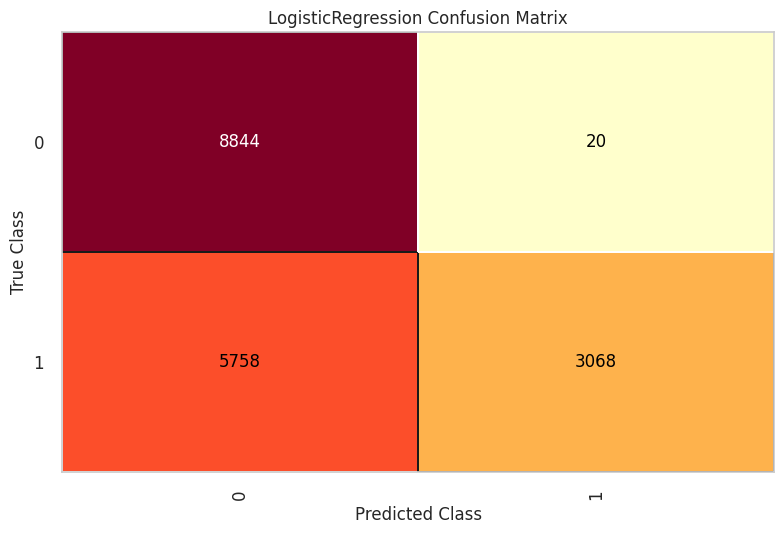

<Axes: title={'center': 'LogisticRegression Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
# Matriz de confusión
cm = ConfusionMatrix(lr_hiperparams, classes=[0, 1])
cm.fit(X_train_scaler, y_train)
cm.score(X_test_scaler, y_test)
cm.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(
/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but LogisticRegression was fitted with feature names
  warnings.warn(


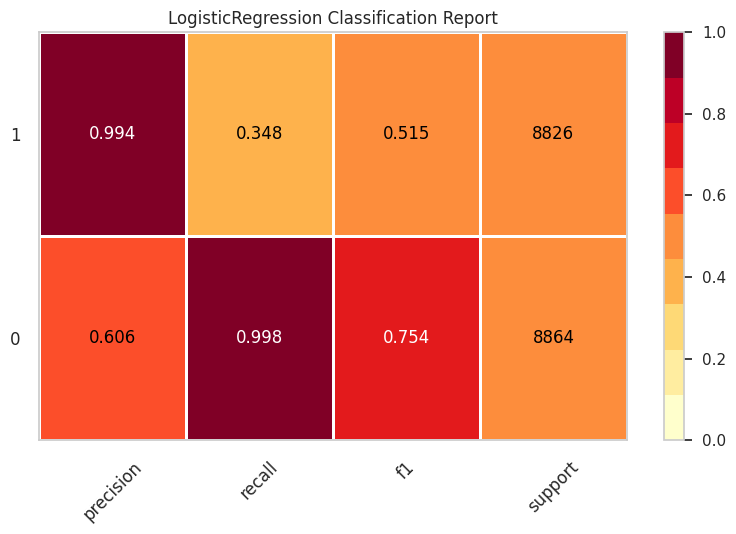

<Axes: title={'center': 'LogisticRegression Classification Report'}>

In [ ]:
# Reporte de clasificación
visualizer = ClassificationReport(lr_hiperparams, classes=[0, 1], support=True)
visualizer.fit(X_train_scaler, y_train)
visualizer.score(X_test_scaler, y_test)
visualizer.show()

Conclusiones preliminares:  
* Con el ajuste de hiperparámetros recomendado (c), la matriz de confusión del modelo indica que disminuyó la cantidad de falsos-positivos considerablemente, sin embargo, hubo un incremento de falsos-negativos, los cuales son el segmento de interés para el hotel (predicción de 'no cancelación' cuando si la hay).  
* Por otro lado, el valor de 'precision' para 'cancelación' subió a 0.994, lo cual es un buen indicador de que el modelo asigna el 99% de las predicciones para esta clase correctamente.  
* Asimismo, el valor de 'recall' para 'no cancelación' es de 0.998, lo que indica que el 99.8% de las predicciones para esta clase fueron realizadas correctamente.

#### Clasificador de bosques aleatorios

In [ ]:
from sklearn.ensemble import RandomForestClassifier

rfc = RandomForestClassifier(random_state=42)

rfc.fit(X_train_clean, y_train) # Entrenamiento

y_pred_rfc = rfc.predict(X_test_clean)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


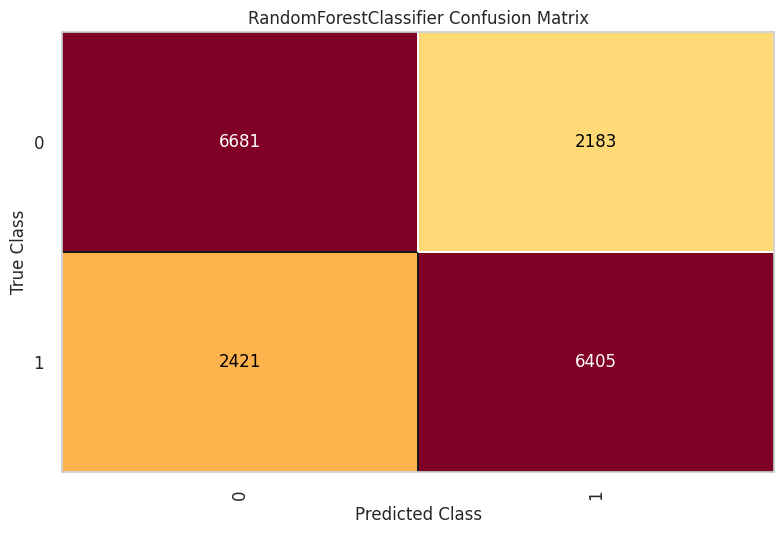

<Axes: title={'center': 'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
# Matriz de confusión
cm_rfc = ConfusionMatrix(rfc, classes=[0, 1])
cm_rfc.fit(X_train_clean, y_train)
cm_rfc.score(X_test_clean, y_test)
cm_rfc.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


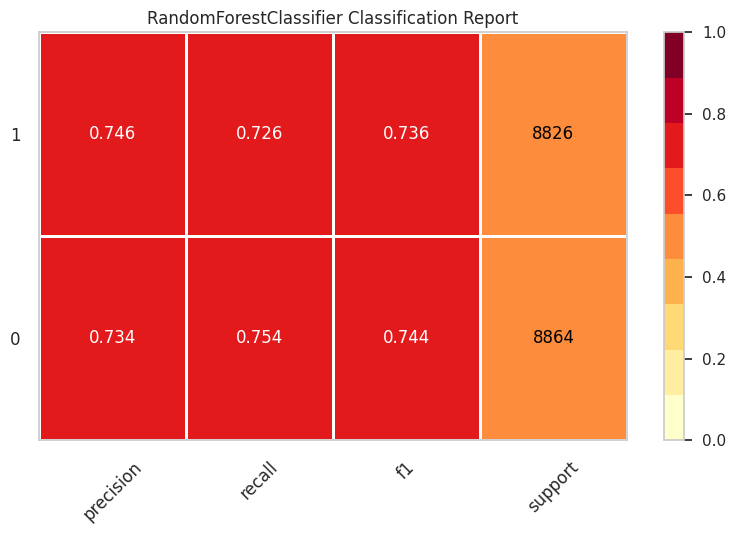

<Axes: title={'center': 'RandomForestClassifier Classification Report'}>

In [ ]:
# Reporte de clasificación
visualizer_rfc = ClassificationReport(rfc, classes=[0, 1], support=True)
visualizer_rfc.fit(X_train_clean, y_train)
visualizer_rfc.score(X_test_clean, y_test)
visualizer_rfc.show()

Conclusiones preliminares:  
* De acuerdo con la matriz de confusión, la cantidad de predicciones de falsos-negativos y falsos-positivos es de 2421 y 2183, respectivamente.  
* En el reporte de métricas de rendimiento, el promedio de los indicadores 'precision', 'recall' y 'f1' es de 0.7. Se realizará el ajuste de hiperparámetros para optimizar estos valores.

In [ ]:
# Búsqueda de hiperparámetros
model = RandomForestClassifier()

param_grid = {
    'n_estimators': [120, 300, 500],
    'max_depth': [5, 8, 15, None],
    'min_samples_split': [1, 2, 5],
    'min_samples_leaf': [1, 2, 5]
}

random_search = RandomizedSearchCV(estimator=model, param_distributions=param_grid, n_iter=10, cv=5, random_state=42)
random_search.fit(X_train_clean, y_train)

print("Mejores hiperparámetros:", random_search.best_params_)

/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py:378: FitFailedWarning: 
20 fits failed out of a total of 50.
The score on these train-test partitions for these parameters will be set to nan.
If these failures are not expected, you can try to debug them by setting error_score='raise'.

Below are more details about the failures:
--------------------------------------------------------------------------------
20 fits failed with the following error:
Traceback (most recent call last):
  File "/usr/local/lib/python3.10/dist-packages/sklearn/model_selection/_validation.py", line 686, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/usr/local/lib/python3.10/dist-packages/sklearn/ensemble/_forest.py", line 340, in fit
    self._validate_params()
  File "/usr/local/lib/python3.10/dist-packages/sklearn/base.py", line 600, in _validate_params
    validate_parameter_constraints(
  File "/usr/local/lib/python3.10/dist-packages/sklearn/utils

Mejores hiperparámetros: {'n_estimators': 500, 'min_samples_split': 5, 'min_samples_leaf': 1, 'max_depth': 15}


In [ ]:
# Entrenamiento de modelo con ajuste de hiperparámetros
rfc_hiperp = RandomForestClassifier(random_state=42, n_estimators=500, min_samples_split=5,
                                    min_samples_leaf=1, max_depth=15)
rfc_hiperp.fit(X_train_clean, y_train) # Entrenamiento
y_pred_rfc_hiperp = rfc.predict(X_test_clean)

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


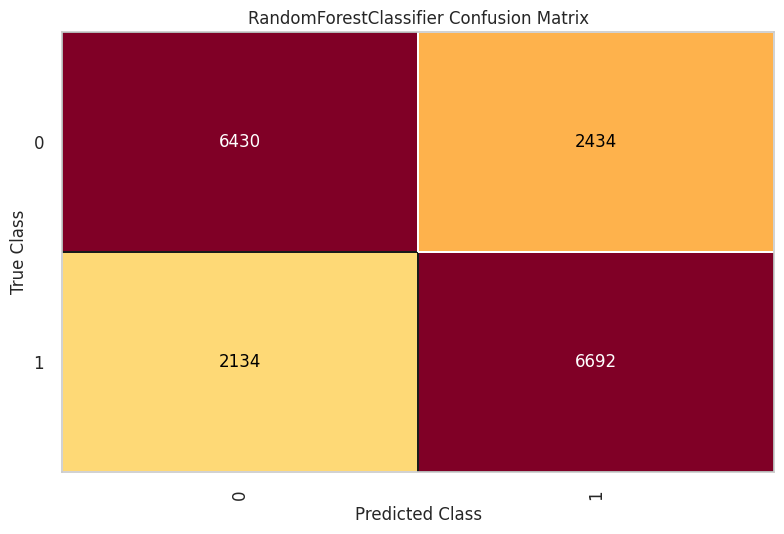

<Axes: title={'center': 'RandomForestClassifier Confusion Matrix'}, xlabel='Predicted Class', ylabel='True Class'>

In [ ]:
# Matriz de confusión
cm_rfc2 = ConfusionMatrix(rfc_hiperp, classes=[0, 1])
cm_rfc2.fit(X_train_clean, y_train)
cm_rfc2.score(X_test_clean, y_test)
cm_rfc2.show()

/usr/local/lib/python3.10/dist-packages/sklearn/base.py:439: UserWarning: X does not have valid feature names, but RandomForestClassifier was fitted with feature names
  warnings.warn(


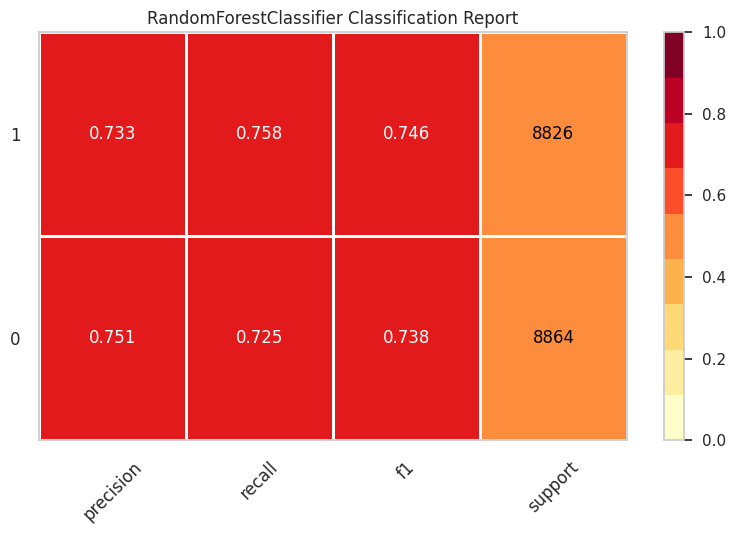

<Axes: title={'center': 'RandomForestClassifier Classification Report'}>

In [ ]:
# Reporte de clasificación
visualizer_rfc2 = ClassificationReport(rfc_hiperp, classes=[0, 1], support=True)
visualizer_rfc2.fit(X_train_clean, y_train)
visualizer_rfc2.score(X_test_clean, y_test)
visualizer_rfc2.show()

Conclusiones preliminares:  
* Aún con el ajuste de hiperparámetros, los valores en la matriz de confusión y en las métricas de rendimiento permanecen similares respecto al primer modelo RandomForestClassifier.  
* Para fines más específicos (y con mayor recurso computacional), la búsqueda de hiperparámetros puede ajustarse aún más, incrementando la cantidad de iteraciones o con otros hiperparámetros.

### Selección del mejor modelo (probabilidad y curva ROC).

In [ ]:
# Predicción de clase
predicted_classes = lr_hiperparams.predict(X_test_clean)
predicted_classes

array([0, 0, 1, ..., 0, 0, 1])

In [ ]:
# Predicción de probabilidad
predicted_prob = lr_hiperparams.predict_proba(X_test_clean)
predicted_prob

array([[5.26143479e-01, 4.73856521e-01],
       [5.31099513e-01, 4.68900487e-01],
       [3.60636224e-04, 9.99639364e-01],
       ...,
       [8.25339809e-01, 1.74660191e-01],
       [7.63546539e-01, 2.36453461e-01],
       [4.43318314e-01, 5.56681686e-01]])

In [ ]:
# Comparación

from sklearn.metrics import accuracy_score

accuracy = accuracy_score(y_test, predicted_classes)
print("Exactitud del modelo:", accuracy)

Exactitud del modelo: 0.7221594120972301


<Figure size 800x550 with 0 Axes>

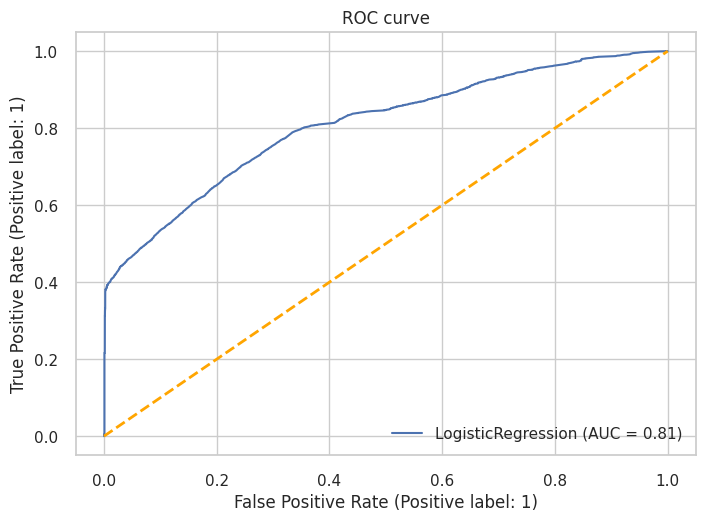

In [ ]:
# Curva ROC de regresión logística
import matplotlib.pyplot as plt
from sklearn.metrics import RocCurveDisplay

plt.figure()
lw = 2
disp = RocCurveDisplay.from_estimator(lr_hiperparams, X_test_clean, y_test)
plt.plot([0, 1], [0, 1], color="orange", lw=lw, linestyle="--")
plt.title("ROC curve")
plt.legend(loc="lower right")
plt.show()

In [ ]:
# Precisión y recall
from sklearn.metrics import precision_recall_curve

precision, recall, _ = precision_recall_curve(y_test, predicted_prob[:, 1])

print(f"Precisión: {precision}")
print(f"Recall: {recall}")

Precisión: [0.49892595 0.49895415 0.49898236 ... 1.         1.         1.        ]
Recall: [1.         1.         1.         ... 0.00396556 0.00385225 0.        ]


### Reporte en CSV

In [ ]:
predictions = pd.DataFrame({
    'Predicción de clase': predicted_classes,
    'Probabilidad de cancelación': predicted_prob[:, 1]
})

predictions.to_csv('predicciones_modelo.csv', index=False)

### Conclusiones finales

Conclusiones finales:  
* Las variables elegidas para realizar el entrenamiento y predicción de los modelos fueron:  
  - 'lead_time', 'previous_cancellations', 'previous_bookings_not_canceled' (numéricas).
   
  - 'deposit_type','hotel', 'market_segment' (categóricas).  
Las variables se elegieron con base en su correlación con la variable de respuesta 'is_canceled'.  

* Se probaron dos modelos de clasificación, regresión logística y bosque aleatoria clasificador. Después de ejecutar estos modelos, ajustar los hiperparámetros y  evaluar las matrices de confusión + los índices de rendimiento  (f1, precision y recal), se determinó que el mejor modelo fue regresión logística.  

* Con este modelo se utilizó el conjunto de datos de prueba y se obtuvo un valor AUC de 0.81, lo que indica que el modelo tiene capacidad predictiva y puede diferenciar entre las clases de respuesta.